# SETUP

## Check environment

In [1]:
USE_GPU = True

## Libraries

In [2]:
# System
import os
import glob
import shutil
import copy
import re
from datetime import datetime
import logging
import sys

# Data
import numpy as np
import pandas as pd

# Visualization
import seaborn as sns
%matplotlib inline
import matplotlib.pyplot as plt
plt.rcParams.update({'figure.max_open_warning': 0})
from tqdm.notebook import tqdm

# Data processing
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split, TimeSeriesSplit, cross_val_score
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
import joblib

# Model
import tensorflow as tf
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, root_mean_squared_error, mean_absolute_percentage_error
from scipy.stats import pearsonr
from keras import Input, Model, Sequential
from keras.layers import Dense, LSTM, RepeatVector, TimeDistributed, Dropout, GRU, Conv1D, MaxPooling1D, Flatten
from keras.utils import plot_model
from keras.saving import load_model
from keras.callbacks import LearningRateScheduler, ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from keras.optimizers import Adam
from keras.losses import MeanAbsoluteError
from keras.losses import MeanAbsoluteError, MeanSquaredError
import keras.backend as K
from tqdm.keras import TqdmCallback
from tensorflow.keras import optimizers

# Append the custom libraries to system path
sys.path.append("/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project")

# Configure device
if not USE_GPU:
    print("Using CPU to train")
    os.environ['CUDA_VISIBLE_DEVICES'] = '-1'
else:
    print("Using GPU to train")
    os.environ['TF_FORCE_GPU_ALLOW_GROWTH'] = "true"

# Custom libraries written by myself
from src.plot import plot_1_data, plot_2_data, plot_3_data, plot_prediction, plot_learning_curves
from src.reduction_model.lstm_s2s import LSTMSeq2SeqReduction
from src.reduction_model.gru_s2s import GRUSeq2SeqReduction
from src.reduction_model.cnnlstm_s2s import CNNLSTMSeq2SeqReduction
from src.prediction_model.lstm import LSTMPrediction, inferenceLSTM
from src.loop_model import generate_loopresults, choose_the_best
from src.reduce_data_utils import prepareReducedData
from src.data_utils import mice
from src.time_series_utils import splitTrainValidationTestTimeSeries, reframePastFuture, padPastFuture

# Checking Tensorflow
print(f"Tensorflow version: {tf.__version__}, GPUs: {tf.config.list_physical_devices('GPU')}")

E0000 00:00:1763514948.758411     205 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1763514948.775571     205 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1763514948.883253     205 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1763514948.883284     205 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1763514948.883286     205 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1763514948.883288     205 computation_placer.cc:177] computation placer already registered. Please check linka

Using GPU to train
Tensorflow version: 2.19.1, GPUs: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


# DATA FROM VIET

## Load dataset

In [3]:
dataset_path = "/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station"

df_raw = []

for csv_file in sorted(glob.glob(f"{dataset_path}/*")):
    print(f"Working on {csv_file}")
    df_station = pd.read_csv(csv_file)
    df_station["station"] = int(os.path.splitext(os.path.basename(csv_file))[0])
    df_raw.append(df_station)
df_raw = pd.concat(df_raw, axis=0)

# Lowercase columns name
df_raw.columns = df_raw.columns.map(lambda col: col.lower().strip())

# Set time index
df_raw["date"] = pd.to_datetime(df_raw["date"])
df_raw.set_index("date", inplace=True)

# Drop columns
features_to_use = ["pm25_quantrac", "tsp_quantrac", "station"]
df_raw = df_raw.loc[:, features_to_use]

df_raw

Working on /le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station/211.csv
Working on /le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station/212.csv
Working on /le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station/213.csv
Working on /le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station/214.csv
Working on /le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station/215.csv
Working on /le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station/216.csv


,pm25_quantrac,tsp_quantrac,station
date,,,
2021-02-23 21:00:00,15.604762,32.935714,211
2021-02-23 22:00:00,14.594118,30.932353,211
2021-02-23 23:00:00,13.436667,27.645000,211
2021-02-24 00:00:00,12.365000,24.380000,211
2021-02-24 01:00:00,11.636667,22.521667,211
...,...,...,...
2022-12-31 19:00:00,41.450000,107.451667,216
2022-12-31 20:00:00,50.530000,126.168333,216
2022-12-31 21:00:00,55.055000,139.688333,216


## Data preparation

### Drop missing

In [4]:
df = []
for station in sorted(df_raw["station"].unique()):
    df_station = df_raw[df_raw["station"] == station]
    df.append(df_station.dropna())
df = pd.concat(df, axis=0)
df

,pm25_quantrac,tsp_quantrac,station
date,,,
2021-02-23 21:00:00,15.604762,32.935714,211
2021-02-23 22:00:00,14.594118,30.932353,211
2021-02-23 23:00:00,13.436667,27.645000,211
2021-02-24 00:00:00,12.365000,24.380000,211
2021-02-24 01:00:00,11.636667,22.521667,211
...,...,...,...
2022-12-31 19:00:00,41.450000,107.451667,216
2022-12-31 20:00:00,50.530000,126.168333,216
2022-12-31 21:00:00,55.055000,139.688333,216


### Scale

In [5]:
df_scaled = copy.deepcopy(df)

# Scale features
features_to_scale = ["tsp_quantrac"]
for f in features_to_scale:
    scaler = MinMaxScaler()
    scaled_data = scaler.fit_transform(df[[f]])
    df_scaled[f] = scaled_data

# Scale label
label = "pm25_quantrac"
label_scaler = MinMaxScaler()
df_scaled[label] = label_scaler.fit_transform(df[[label]])

# Drop station column
df_scaled = df_scaled.drop(columns=["station"], errors="ignore")

df_scaled

,pm25_quantrac,tsp_quantrac
date,,
2021-02-23 21:00:00,0.096032,0.091311
2021-02-23 22:00:00,0.089813,0.085757
2021-02-23 23:00:00,0.082690,0.076643
2021-02-24 00:00:00,0.076095,0.067591
2021-02-24 01:00:00,0.071612,0.062439
...,...,...
2022-12-31 19:00:00,0.255085,0.297899
2022-12-31 20:00:00,0.310963,0.349789
2022-12-31 21:00:00,0.338810,0.387272


### Train test split

In [6]:
splitter = round(0.8 * len(df_scaled))
train_data = df_scaled.iloc[:splitter]
test_data = df_scaled.iloc[splitter:]

display(train_data)
display(test_data)

,pm25_quantrac,tsp_quantrac
date,,
2021-02-23 21:00:00,0.096032,0.091311
2021-02-23 22:00:00,0.089813,0.085757
2021-02-23 23:00:00,0.082690,0.076643
2021-02-24 00:00:00,0.076095,0.067591
2021-02-24 01:00:00,0.071612,0.062439
...,...,...
2021-09-21 06:00:00,0.059110,0.052214
2021-09-21 07:00:00,0.065058,0.058590
2021-09-21 08:00:00,0.067930,0.060540


,pm25_quantrac,tsp_quantrac
date,,
2021-09-21 11:00:00,0.065315,0.057731
2021-09-21 12:00:00,0.059551,0.050703
2021-09-21 13:00:00,0.058597,0.048018
2021-09-21 14:00:00,0.053520,0.039493
2021-09-21 15:00:00,0.064546,0.053170
...,...,...
2022-12-31 19:00:00,0.255085,0.297899
2022-12-31 20:00:00,0.310963,0.349789
2022-12-31 21:00:00,0.338810,0.387272


## Prediction

### Model paramaters

In [7]:
n_past = 168

epochs = 100
batch_size = 128

In [8]:
# Calculate MNBE
def mean_normalized_bias_error(y_pred, y_actual):
    y_pred = np.array(y_pred)
    y_actual = np.array(y_actual)
    return np.mean((y_pred - y_actual) / np.mean(y_actual)) * 100

metrics_calculators = {
    "mae": mean_absolute_error,
    "mse": mean_squared_error,
    "rmse": root_mean_squared_error,
    "r2": r2_score,
    "mape": mean_absolute_percentage_error,
    "mnbe": mean_normalized_bias_error,
    "r_coeff": lambda a,b: pearsonr(a, b)[0]
}

### Reframe data

In [9]:
# Function to reframe data
def reframe(input_data, n_past, n_future, n_shifted=0):
    data = copy.deepcopy(input_data)
    m = np.arange(0, len(data) - n_past - n_future - n_shifted + 1)
    X = np.array([data.iloc[i:(i + n_past), :] for i in m])
    label_index_col = 0
    y = np.expand_dims(np.array([data.iloc[(i + n_shifted + n_past):(i + n_shifted + n_past + n_future), 0] for i in m]), -1)
    return X, y

X_train_1day, y_train_1day = reframe(train_data, n_past, 24)
X_test_1day, y_test_1day = reframe(test_data, n_past, 24)
print(X_train_1day.shape, y_train_1day.shape, X_test_1day.shape, y_test_1day.shape)

(39747, 168, 2) (39747, 24, 1) (9794, 168, 2) (9794, 24, 1)


### Define callbacks

In [10]:
reduce_lr_callback = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6, verbose=1)
early_stopping_callback = EarlyStopping(monitor='val_loss', min_delta=0, patience=10, verbose=1, restore_best_weights=True),

### LSTM-Seq2Seq

In [11]:
def define_lstms2s_model(n_past, n_future, n_features, n_label, name="model"):
    encoder_inputs = Input(shape=(n_past, n_features))
    encoder_lstm_1 = LSTM(128, return_sequences=True, activation="relu")(encoder_inputs)
    decoder_lstm_2 = LSTM(64, activation="relu", dropout=0.2)(encoder_lstm_1)
    decoder_dense = Dense(32, activation="relu")(decoder_lstm_2)
    decoder_outputs = Dense(n_future)(decoder_dense)

    # Compile the model
    model = Model(encoder_inputs, decoder_outputs)
    model.name = name
    model.compile(optimizer=Adam(learning_rate=0.001), loss=MeanAbsoluteError())
    display(model.summary())
    return model

#### 24 hours

I0000 00:00:1763514977.087585     205 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 38366 MB memory:  -> device: 0, name: NVIDIA A100-PCIE-40GB, pci bus id: 0000:b1:00.0, compute capability: 8.0


Model: "lstms2s_24hours"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 168, 2)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm (LSTM)                     │ (None, 168, 128)       │        67,072 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 64)             │        49,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 24)             │           792 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 119,352 (466.22 KB)

 Trainable params: 119,352 (466.22 KB)

 Non-trainable params: 0 (0.00 B)

None

Epoch 1/100


I0000 00:00:1763514983.903008     290 service.cc:152] XLA service 0x7cee1401c900 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1763514983.903036     290 service.cc:160]   StreamExecutor device (0): NVIDIA A100-PCIE-40GB, Compute Capability 8.0
I0000 00:00:1763514985.037042     290 cuda_dnn.cc:529] Loaded cuDNN version 90300
I0000 00:00:1763514996.367241     290 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


249/249 ━━━━━━━━━━━━━━━━━━━━ 38s 82ms/step - loss: 0.0546 - val_loss: 0.0295 - learning_rate: 0.0010
Epoch 2/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step - loss: 0.0496 - val_loss: 0.0293 - learning_rate: 0.0010
Epoch 3/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step - loss: 0.0488 - val_loss: 0.0298 - learning_rate: 0.0010
Epoch 4/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step - loss: 0.0468 - val_loss: 0.0294 - learning_rate: 0.0010
Epoch 5/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0463 - val_loss: 0.0289 - learning_rate: 0.0010
Epoch 6/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 17s 58ms/step - loss: 0.0452 - val_loss: 0.0283 - learning_rate: 0.0010
Epoch 7/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 13s 47ms/step - loss: 0.0446 - val_loss: 0.0279 - learning_rate: 0.0010
Epoch 8/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.0444 - val_loss: 0.0277 - learning_rate: 0.0010
Epoch 9/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step - loss: 0.0440 - val_loss: 0.0276 - learning_rate: 0.0

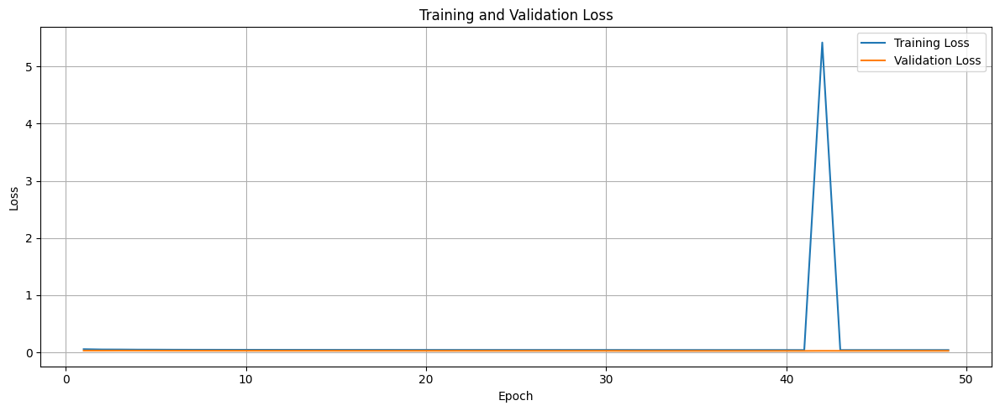

307/307 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step
y_pred_1day.shape = (9794, 24)
inv_y_pred_1day.shape = (9794, 24, 1)
inv_y_test_1day.shape = (9794, 24, 1)
Day = 0
mae: 3.5553687602581596
mse: 17.42223604001389
rmse: 4.173995213223644
r2: 0.5637456674622724
mape: 0.21716982239799676
mnbe: -16.799726077838496
r_coeff: [0.97244161]


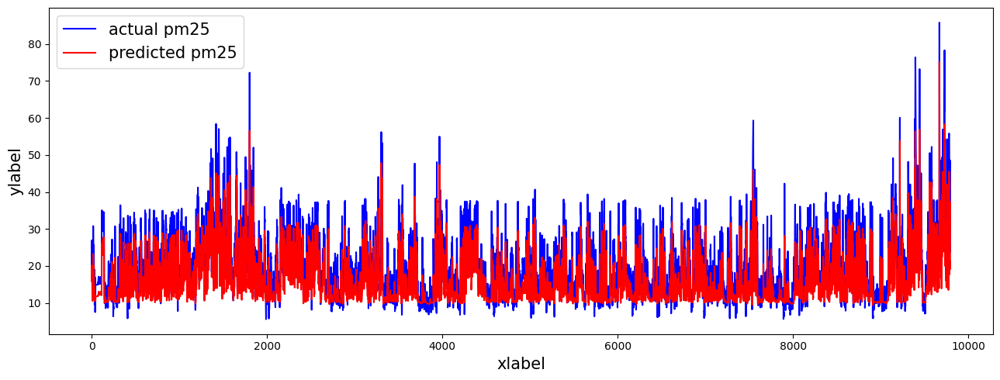

Day = 1
mae: 4.133728799692016
mse: 32.88304493439938
rmse: 5.734373979293588
r2: 0.009638439040371205
mape: 0.25528127370767995
mnbe: -16.769919389507944
r_coeff: [0.83504368]


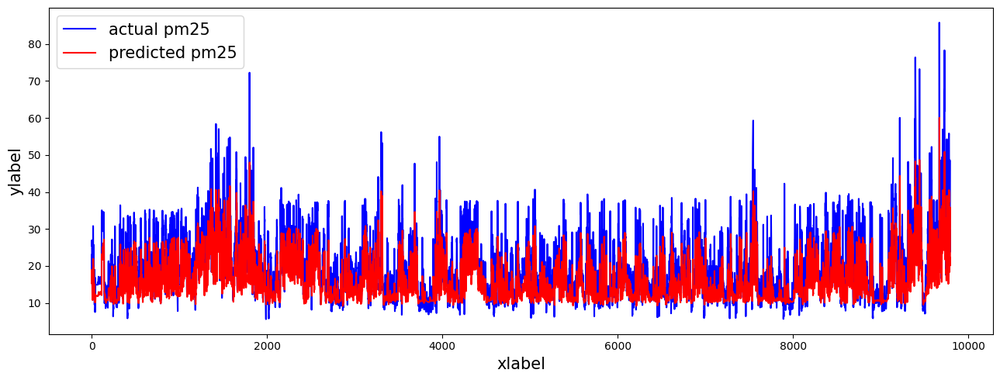

Day = 2
mae: 4.691806298000719
mse: 45.3265958782676
rmse: 6.732502943056735
r2: -0.7419910807298131
mape: 0.2908033874794331
mnbe: -16.836652458811052
r_coeff: [0.71337667]


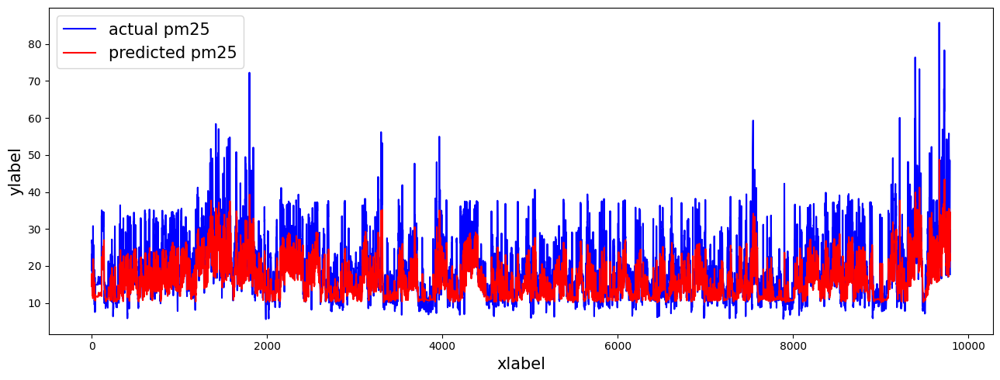

Day = 3
mae: 5.056388125313531
mse: 53.966986067498496
rmse: 7.346222571328648
r2: -1.710065086559473
mape: 0.3164252192128644
mnbe: -17.570349909873617
r_coeff: [0.62971527]


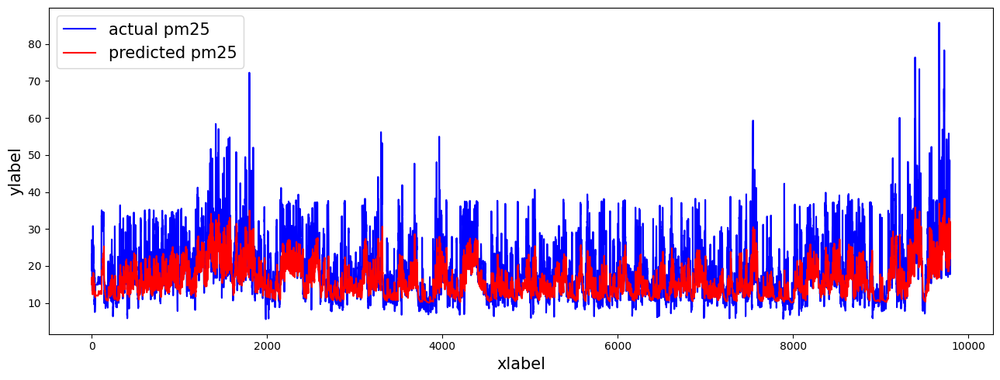

Day = 4
mae: 5.210414920461602
mse: 57.230912864743594
rmse: 7.565111556662175
r2: -2.0965683478798818
mape: 0.32413094929411657
mnbe: -16.336166289902714
r_coeff: [0.56640188]


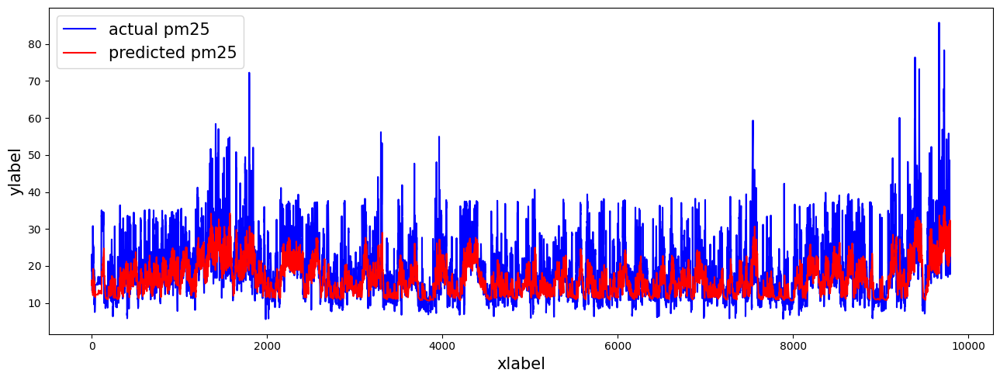

Day = 5
mae: 5.325975443288871
mse: 59.41738525972357
rmse: 7.708267331879686
r2: -2.3137634244601295
mape: 0.3293271986719789
mnbe: -15.278314851571745
r_coeff: [0.51868826]


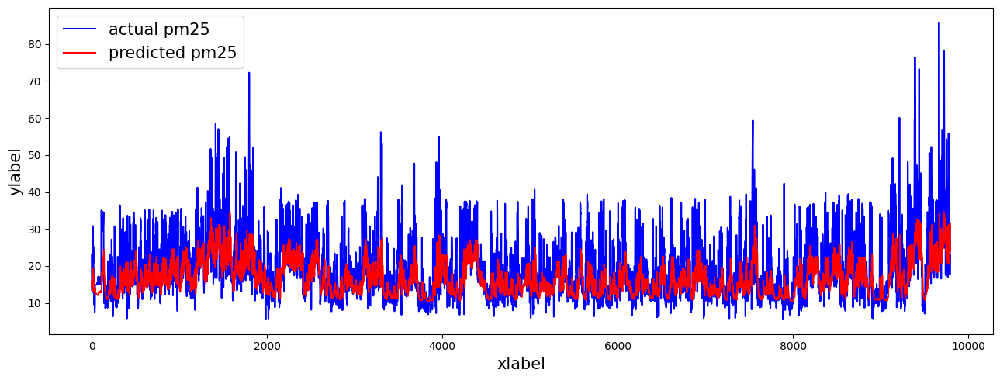

Day = 6
mae: 5.3942207285508905
mse: 60.10386655639085
rmse: 7.752668350728725
r2: -2.4404700471993026
mape: 0.3281051511006987
mnbe: -13.529449930008166
r_coeff: [0.48217296]


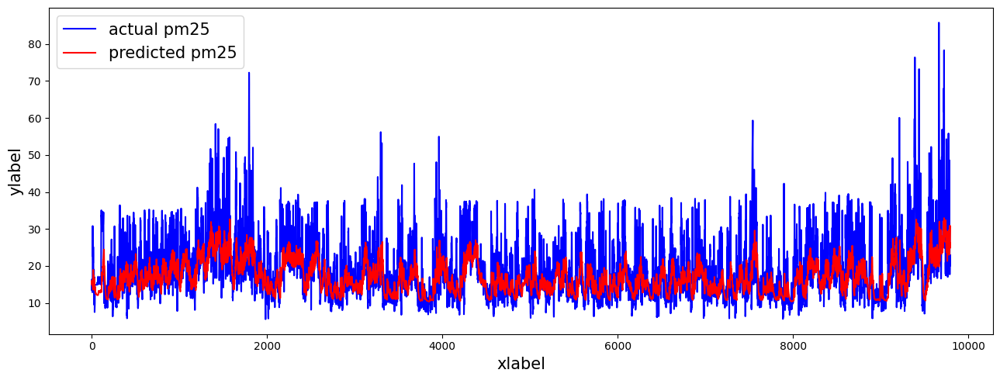

Day = 7
mae: 5.540079006903822
mse: 63.62996617136488
rmse: 7.9768393597567755
r2: -2.9027423501963168
mape: 0.3452527915202806
mnbe: -15.186357453106158
r_coeff: [0.45560521]


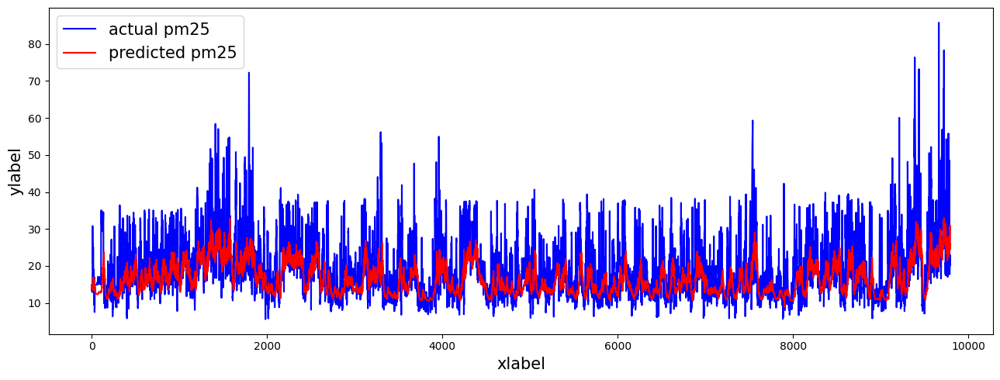

Day = 8
mae: 5.535409999472445
mse: 62.858520505445654
rmse: 7.92833655349252
r2: -2.702356154057783
mape: 0.33921452231242655
mnbe: -13.563703800497978
r_coeff: [0.44233767]


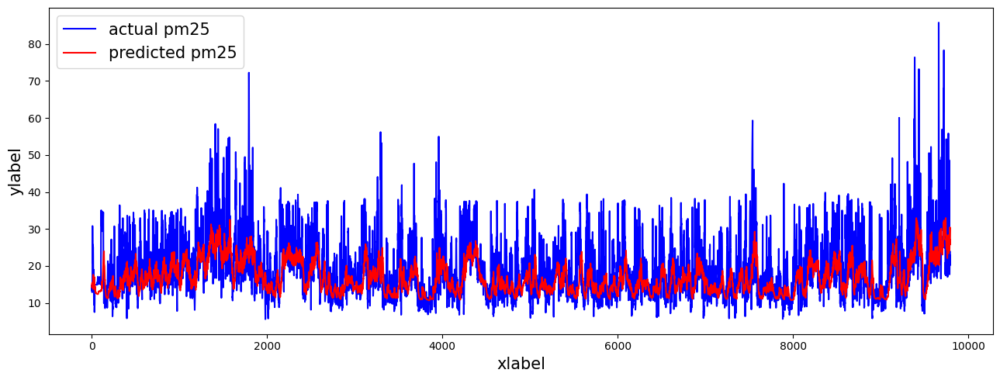

Day = 9
mae: 5.5619897878018305
mse: 62.87785583358258
rmse: 7.92955584087675
r2: -2.6971023354328807
mape: 0.33810248204741095
mnbe: -12.744823092897015
r_coeff: [0.43050096]


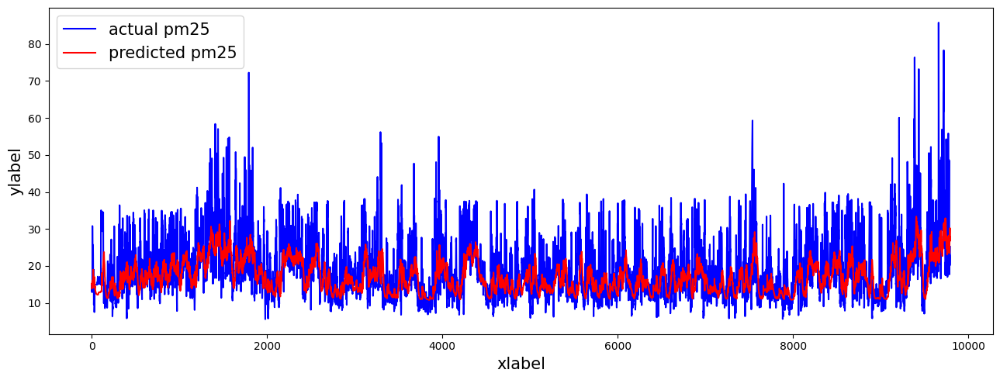

Day = 10
mae: 5.619198633775965
mse: 64.5889171766481
rmse: 8.036723037199184
r2: -3.1056341375684138
mape: 0.3462497091955929
mnbe: -13.934059424074288
r_coeff: [0.42033998]


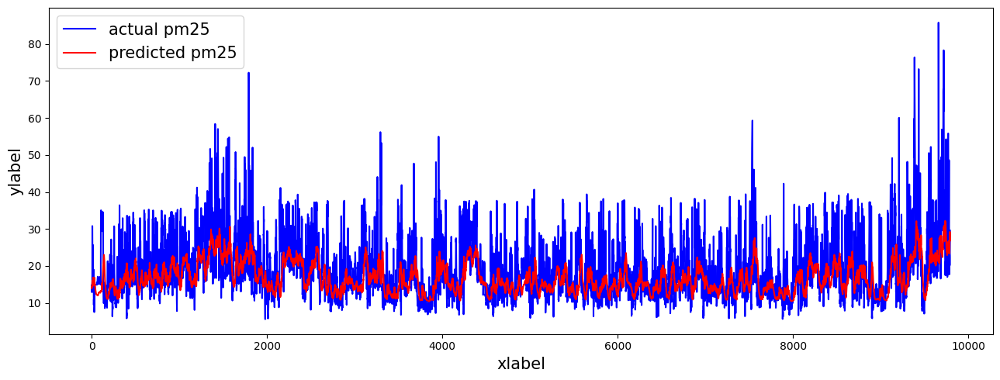

Day = 11
mae: 5.634602586360402
mse: 64.28878831305299
rmse: 8.018028954366091
r2: -2.90329498987511
mape: 0.34431284308229043
mnbe: -13.076959344729122
r_coeff: [0.41356739]


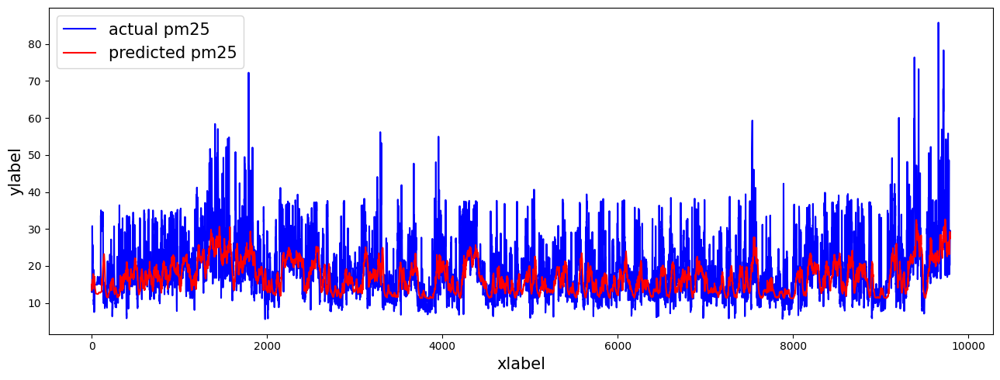

Day = 12
mae: 5.654387616143155
mse: 64.93601142756701
rmse: 8.058288368355095
r2: -2.8053086661979645
mape: 0.3487496070225008
mnbe: -13.483645271525502
r_coeff: [0.41144955]


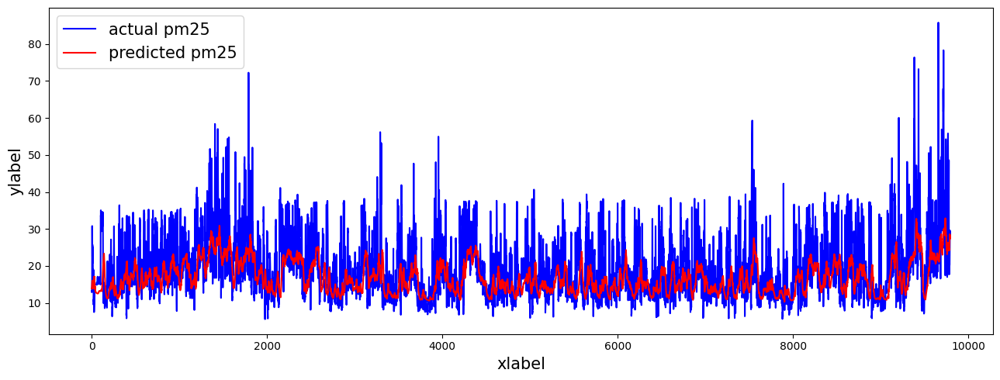

Day = 13
mae: 5.658684800879942
mse: 64.17715793205718
rmse: 8.01106471900316
r2: -2.787979566171986
mape: 0.3434190321535942
mnbe: -12.411733504022624
r_coeff: [0.40732399]


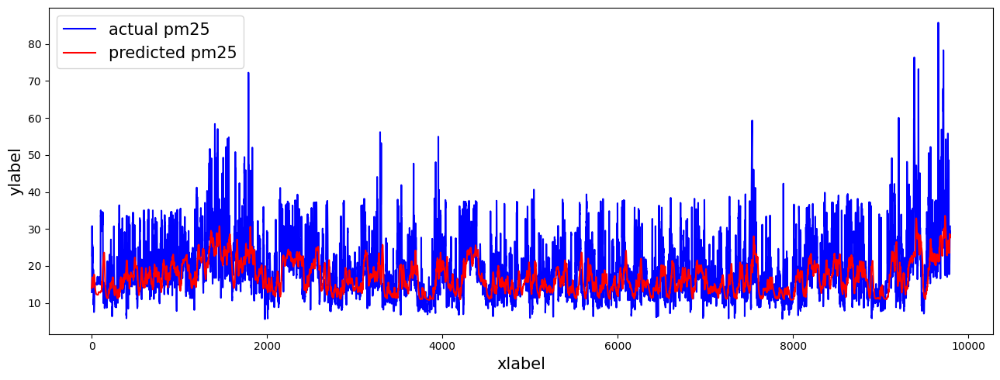

Day = 14
mae: 5.719217716058165
mse: 65.84902980875243
rmse: 8.1147415121341
r2: -2.951117955590276
mape: 0.35268917912016357
mnbe: -13.51869985345717
r_coeff: [0.39775427]


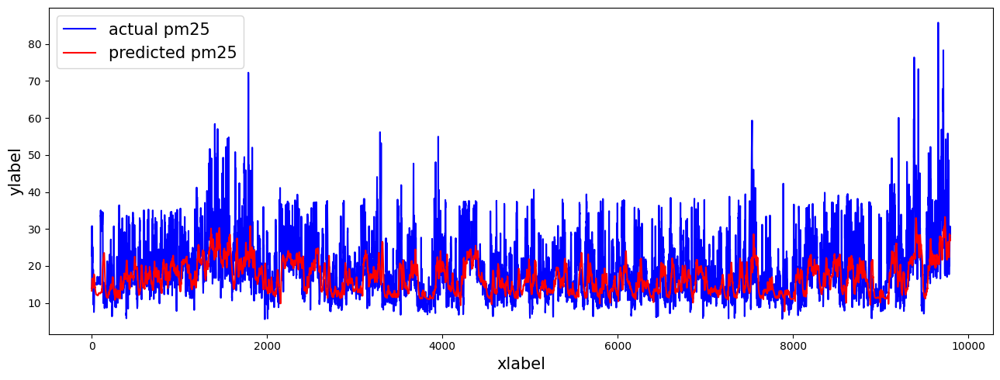

Day = 15
mae: 5.725873238489464
mse: 65.88554532050956
rmse: 8.116991149466012
r2: -2.9475850288586147
mape: 0.3531405806225096
mnbe: -13.57904997411093
r_coeff: [0.39815903]


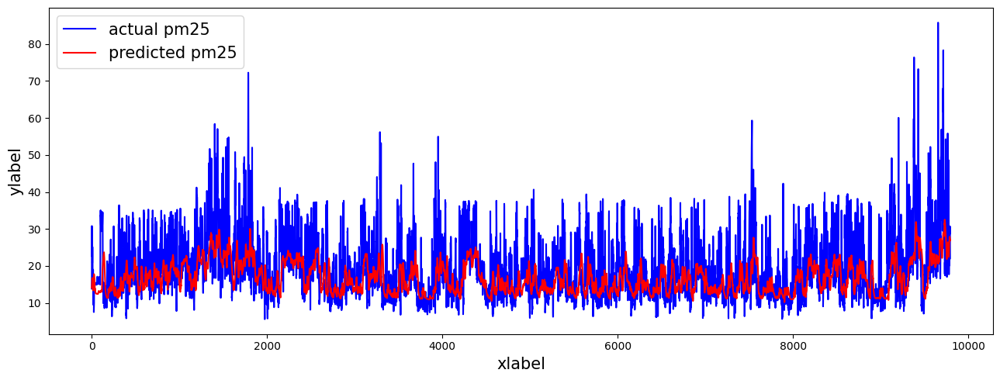

Day = 16
mae: 5.712771188023451
mse: 65.43371965328636
rmse: 8.089111178200382
r2: -2.9313718999786795
mape: 0.34907009598576805
mnbe: -12.909229835970976
r_coeff: [0.39503737]


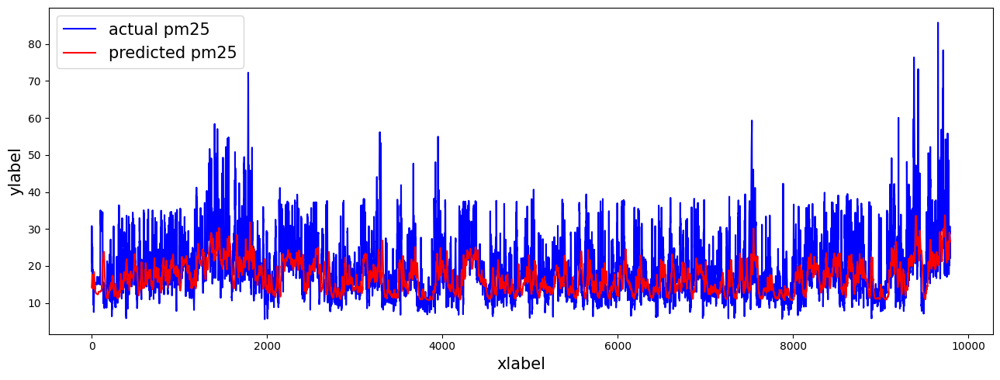

Day = 17
mae: 5.79348425602545
mse: 67.51235154332032
rmse: 8.216590019181943
r2: -3.105508949730451
mape: 0.36125721412085754
mnbe: -14.42993220715536
r_coeff: [0.38664621]


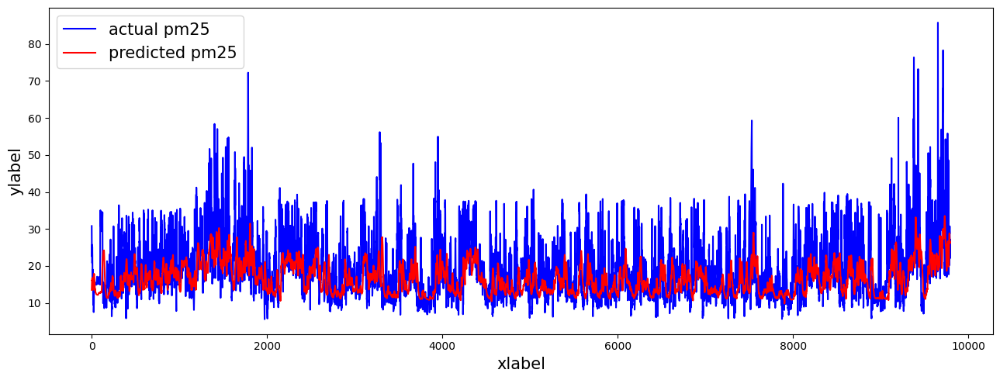

Day = 18
mae: 5.739686793949548
mse: 66.70539079243505
rmse: 8.167336823740959
r2: -3.2827136450989496
mape: 0.3563954116139994
mnbe: -14.410011892825327
r_coeff: [0.39616448]


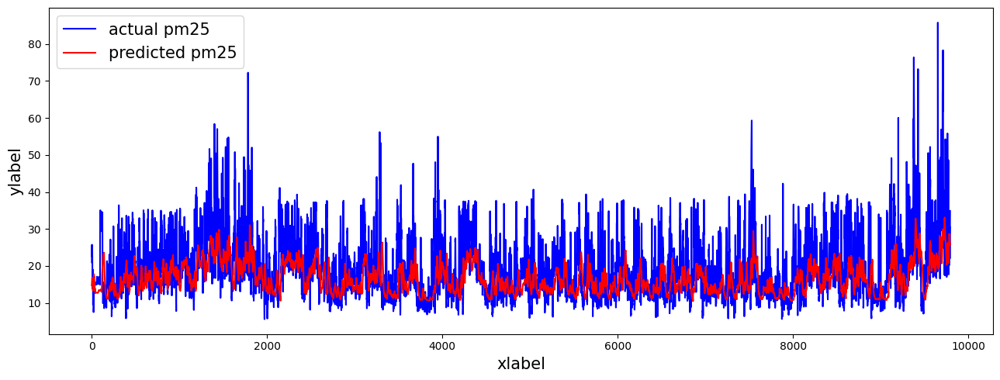

Day = 19
mae: 5.726593052467411
mse: 66.62713280403054
rmse: 8.162544505485439
r2: -3.533206024170581
mape: 0.35418882242638877
mnbe: -14.405818610832663
r_coeff: [0.39562904]


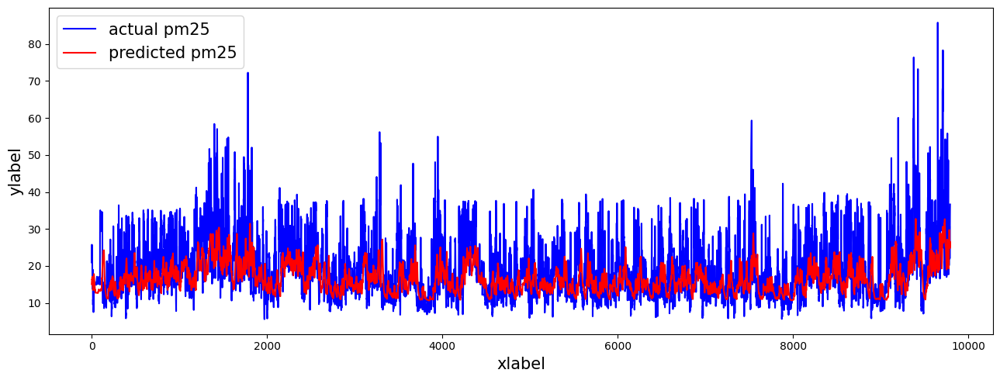

Day = 20
mae: 5.758421202485156
mse: 67.57350009940849
rmse: 8.22031021917108
r2: -3.9336928557798254
mape: 0.358753361832709
mnbe: -15.169099872147084
r_coeff: [0.39254581]


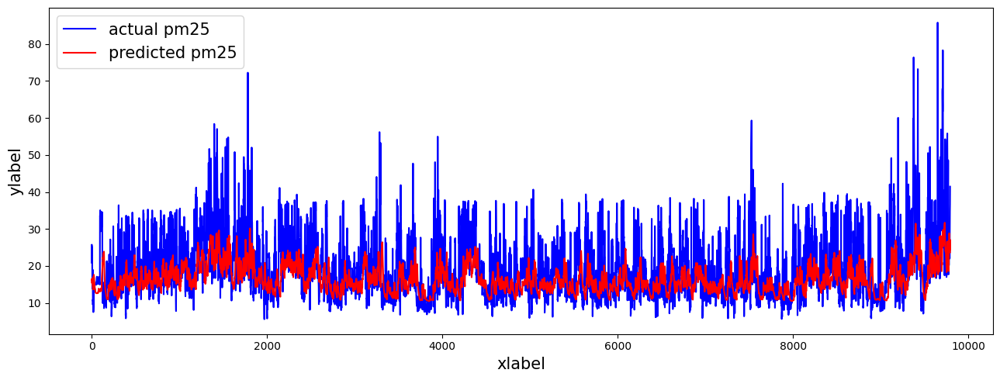

Day = 21
mae: 5.787711606948954
mse: 67.78436952491214
rmse: 8.233126351812666
r2: -3.137191515929377
mape: 0.35938648084040276
mnbe: -14.260065698331658
r_coeff: [0.38206039]


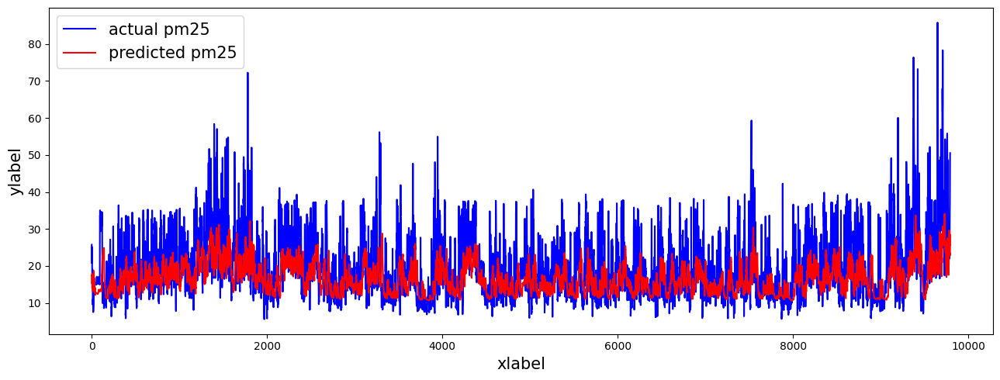

Day = 22
mae: 5.800432011900376
mse: 68.63093864618911
rmse: 8.284379194978287
r2: -3.508911240351196
mape: 0.3635756574615335
mnbe: -15.2556885878627
r_coeff: [0.3839319]


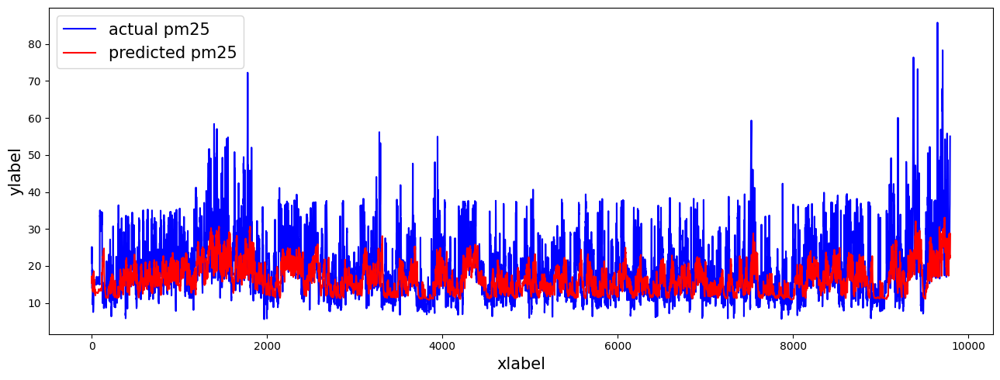

Day = 23
mae: 5.784040083005505
mse: 67.54339151545149
rmse: 8.218478661860203
r2: -3.308520385886264
mape: 0.35712848396501673
mnbe: -13.977333530996747
r_coeff: [0.38070319]


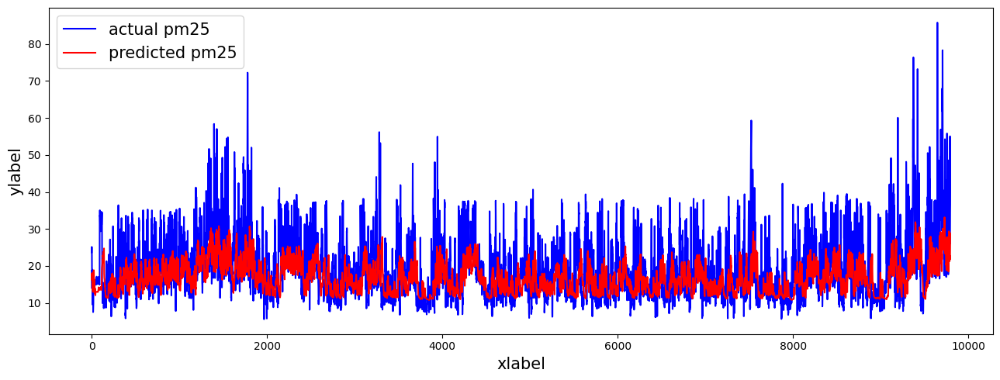

In [12]:
n_future = 24

lstms2s = define_lstms2s_model(n_past, n_future, X_train_1day.shape[-1], y_train_1day.shape[-1], f"lstms2s_{n_future}hours")

history = lstms2s.fit(X_train_1day, y_train_1day,
                epochs=epochs,
                batch_size=batch_size,
                validation_split=0.2,
                shuffle=False,
                callbacks = [reduce_lr_callback, early_stopping_callback],
                verbose=1)
plot_learning_curves(history)

# Predict data
y_pred_1day = lstms2s.predict(X_test_1day)
print(f"y_pred_1day.shape = {y_pred_1day.shape}")

inv_y_pred_1day = np.expand_dims(label_scaler.inverse_transform(y_pred_1day), -1)
inv_y_test_1day = np.expand_dims(label_scaler.inverse_transform(y_test_1day[:, :, 0]), -1)
print(f"inv_y_pred_1day.shape = {inv_y_pred_1day.shape}\ninv_y_test_1day.shape = {inv_y_test_1day.shape}")

# Evaluation
for day in range(n_future):
    print(f"Day = {day}")
    
    current_day_y_pred, current_day_y_test = inv_y_pred_1day[:, day, :], inv_y_test_1day[:, day, :]
    shifted_inv_y_pred, shifted_inv_y_test = current_day_y_pred[1:], current_day_y_test[:-1]
    
    for metric, calculator in metrics_calculators.items():
        print(f"{metric}: {calculator(shifted_inv_y_pred, shifted_inv_y_test)}")
    plot_2_data(data1=shifted_inv_y_test, datalabel1="actual pm25", data2=shifted_inv_y_pred, datalabel2="predicted pm25")

### GRU-Seq2Seq

In [13]:
def define_grus2s_model(n_past, n_future, n_features, n_label, name="model"):
    encoder_inputs = Input(shape=(n_past, n_features))
    encoder_lstm_1 = GRU(128, return_sequences=True, activation="relu")(encoder_inputs)
    decoder_lstm_2 = GRU(64, activation="relu", dropout=0.2)(encoder_lstm_1)
    decoder_dense = Dense(32, activation="relu")(decoder_lstm_2)
    decoder_outputs = Dense(n_future)(decoder_dense)

    # Compile the model
    model = Model(encoder_inputs, decoder_outputs)
    model.name = name
    model.compile(optimizer=Adam(learning_rate=0.001), loss=MeanAbsoluteError())
    display(model.summary())
    return model

#### 24 hours

Model: "grus2s_24hours"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 168, 2)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru (GRU)                       │ (None, 168, 128)       │        50,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_1 (GRU)                     │ (None, 64)             │        37,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 24)             │           792 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 90,808 (354.72 KB)

 Trainable params: 90,808 (354.72 KB)

 Non-trainable params: 0 (0.00 B)

None

Epoch 1/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step - loss: 0.0536 - val_loss: 0.0311 - learning_rate: 0.0010
Epoch 2/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step - loss: 0.0489 - val_loss: 0.0289 - learning_rate: 0.0010
Epoch 3/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step - loss: 0.0480 - val_loss: 0.0289 - learning_rate: 0.0010
Epoch 4/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step - loss: 0.0460 - val_loss: 0.0285 - learning_rate: 0.0010
Epoch 5/100
248/249 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0446
Epoch 5: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
249/249 ━━━━━━━━━━━━━━━━━━━━ 11s 41ms/step - loss: 0.0454 - val_loss: 0.0281 - learning_rate: 0.0010
Epoch 6/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 17s 58ms/step - loss: 0.0445 - val_loss: 0.0280 - learning_rate: 5.0000e-04
Epoch 7/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step - loss: 0.0434 - val_loss: 0.0273 - learning_rate: 5.0000e-04
Epoch 8/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step - loss: 0.042

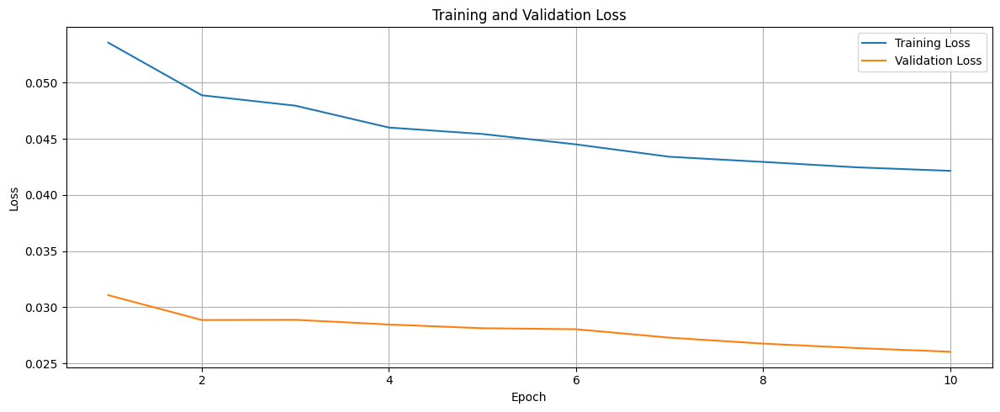

307/307 ━━━━━━━━━━━━━━━━━━━━ 6s 15ms/step
y_pred_1day.shape = (9794, 24)
inv_y_pred_1day.shape = (9794, 24, 1)
inv_y_test_1day.shape = (9794, 24, 1)
Day = 0
mae: 10.257346172736804
mse: 160.74676904030113
rmse: 12.6785949158533
r2: -188.52537387846323
mape: 1.0786862042841514
mnbe: -53.13284285697739
r_coeff: [0.92723778]


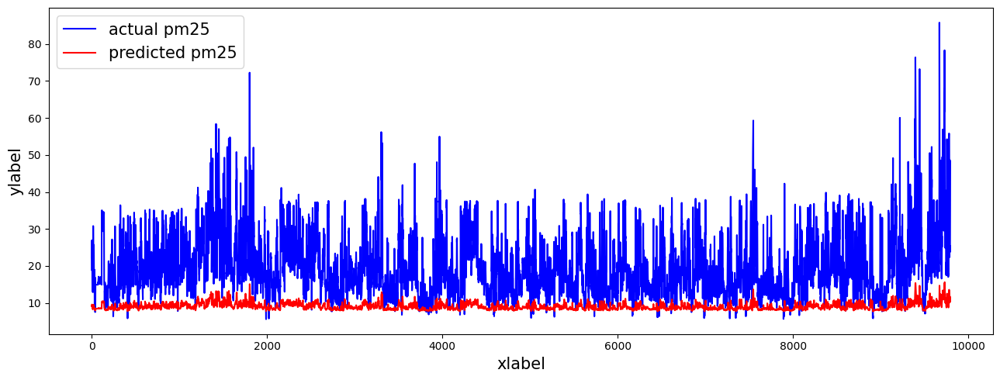

Day = 1
mae: 9.830349785962403
mse: 154.26242437320806
rmse: 12.42024252473389
r2: -202.47059372408606
mape: 0.9948772162432841
mnbe: -50.77127194521339
r_coeff: [0.79541912]


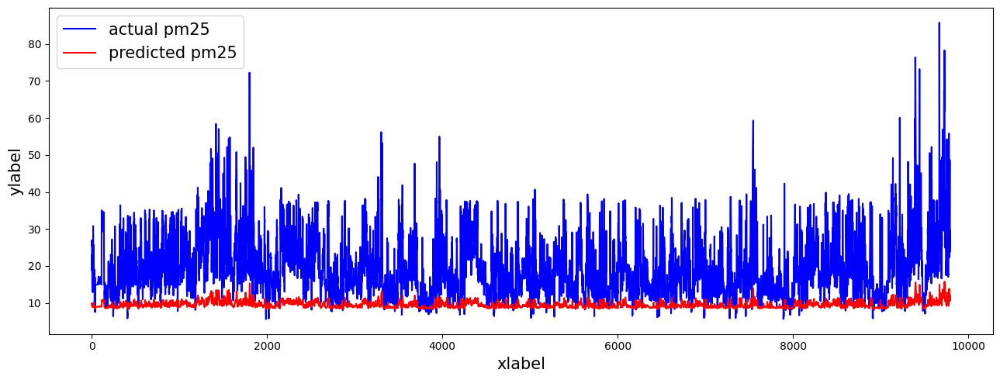

Day = 2
mae: 7.891687660609152
mse: 117.24663748002118
rmse: 10.8280486459944
r2: -187.65724498208934
mape: 0.6494715604330381
mnbe: -38.90260691528311
r_coeff: [0.68050737]


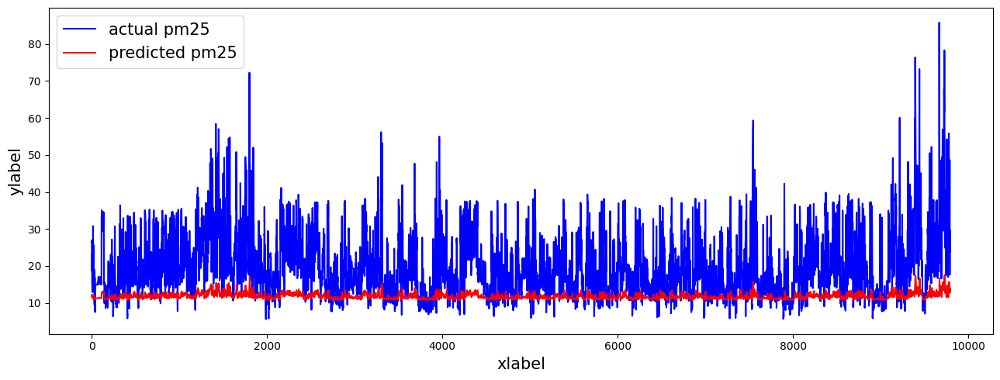

Day = 3
mae: 8.645940563358426
mse: 135.72325965265756
rmse: 11.650032603072729
r2: -851.1929495149951
mape: 0.7812473516342174
mnbe: -43.47502914744839
r_coeff: [0.59602133]


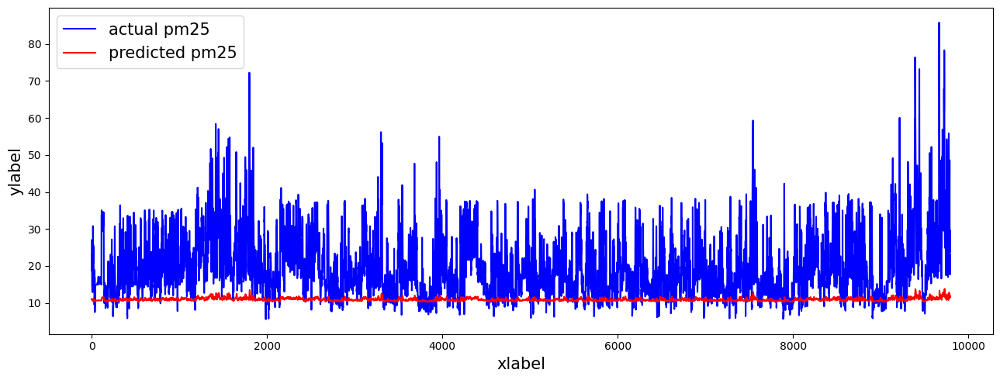

Day = 4
mae: 8.383566267735818
mse: 130.22491893302697
rmse: 11.411613336116282
r2: -598.9486123390495
mape: 0.735683716964848
mnbe: -41.76950396017999
r_coeff: [0.53082759]


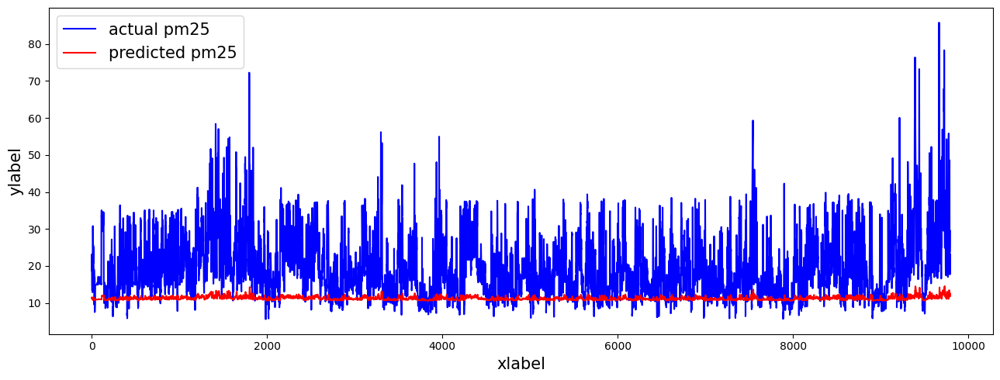

Day = 5
mae: 7.8198638777898415
mse: 118.53839704566835
rmse: 10.88753402041382
r2: -448.9662344644215
mape: 0.6430198056739083
mnbe: -37.737063678871216
r_coeff: [0.46397188]


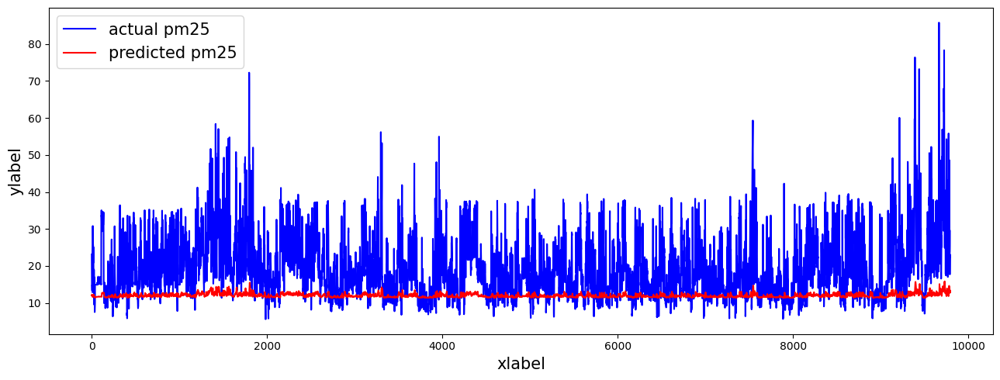

Day = 6
mae: 7.752475683909519
mse: 117.81208188058648
rmse: 10.854127412214511
r2: -1326.791282323134
mape: 0.6323701417488161
mnbe: -36.841933553414734
r_coeff: [0.41127275]


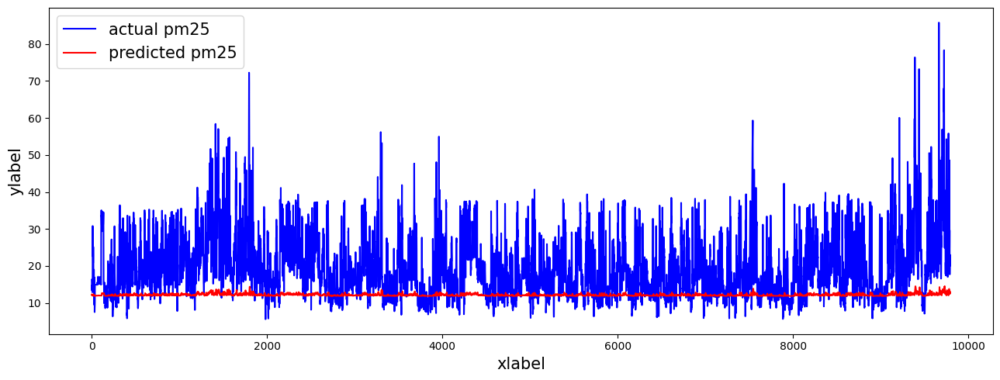

Day = 7
mae: 8.645622942931528
mse: 135.91539764812768
rmse: 11.658275929490076
r2: -338.33201473898373
mape: 0.7845390619020914
mnbe: -43.48781456131944
r_coeff: [0.38392543]


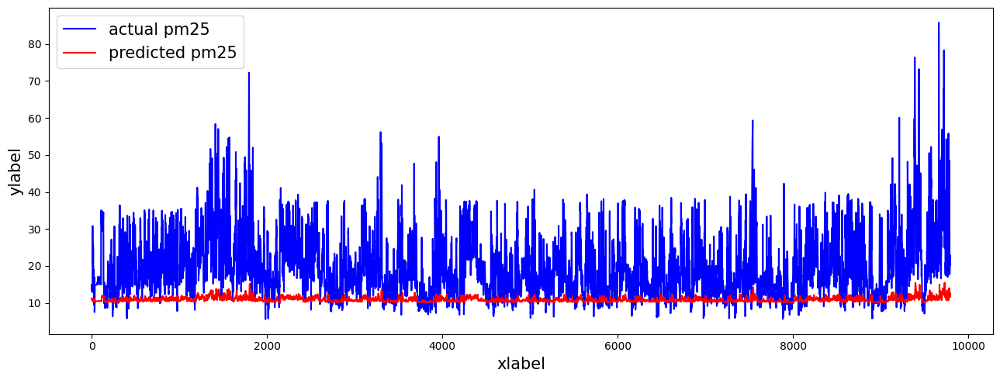

Day = 8
mae: 7.637624272398125
mse: 114.9642199424253
rmse: 10.722136911195701
r2: -262.9178359383781
mape: 0.6162172184267566
mnbe: -36.37573885342615
r_coeff: [0.36156706]


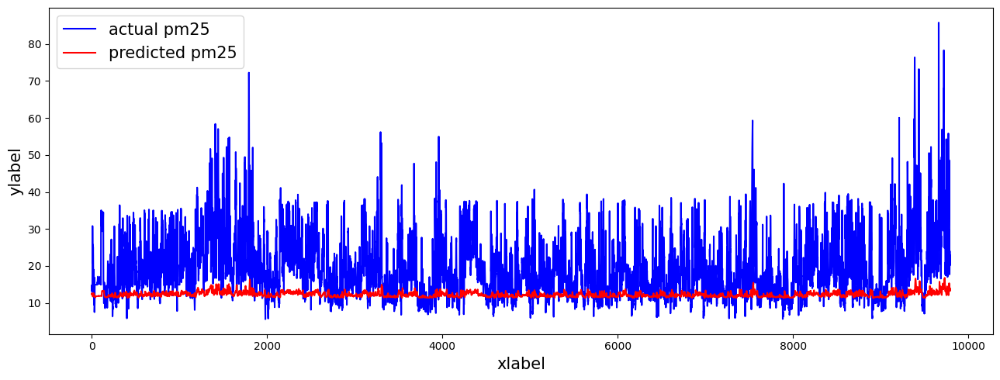

Day = 9
mae: 7.655555159580743
mse: 115.97410889262531
rmse: 10.769127582707213
r2: -1279.3900110497173
mape: 0.617458958431984
mnbe: -35.99233928858094
r_coeff: [0.31894685]


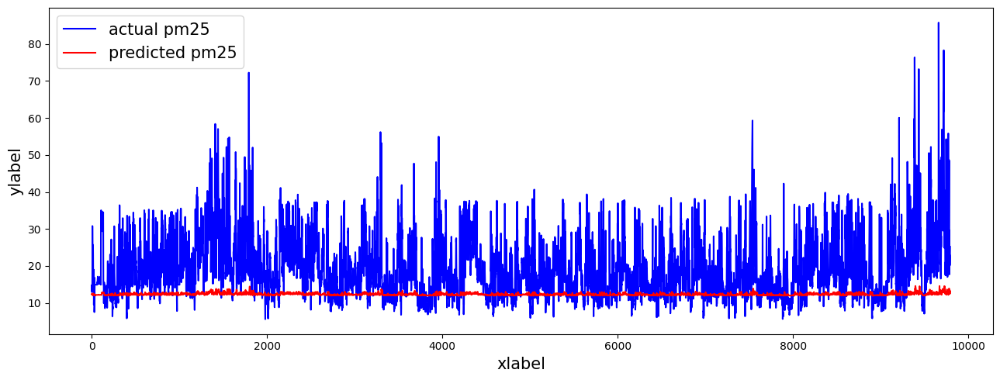

Day = 10
mae: 8.258459721836468
mse: 128.58797443724703
rmse: 11.339663770908158
r2: -575.3984213128376
mape: 0.7171243227106124
mnbe: -40.72806726385682
r_coeff: [0.33188264]


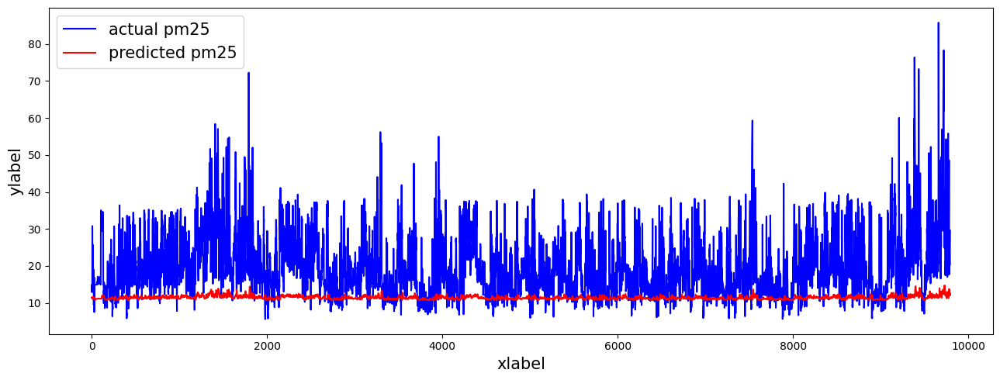

Day = 11
mae: 8.887017465128496
mse: 141.88512975351935
rmse: 11.911554464196492
r2: -592.5891747996603
mape: 0.8302340500198845
mnbe: -44.86663719039403
r_coeff: [0.30590557]


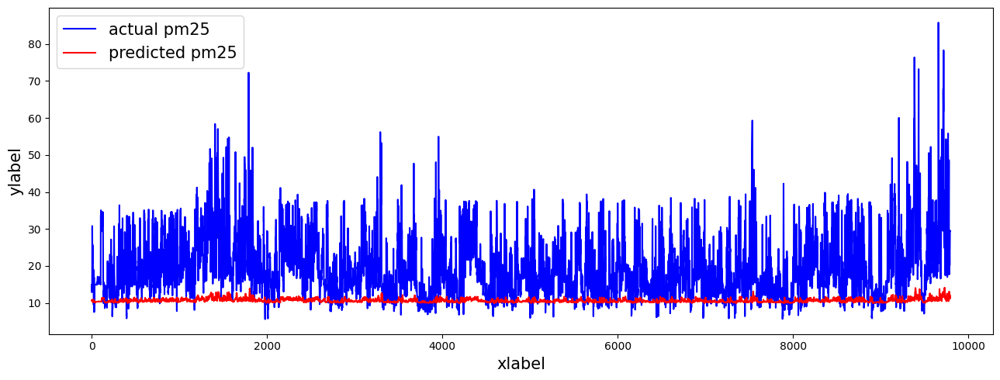

Day = 12
mae: 6.783128408493532
mse: 95.66269386390118
rmse: 9.780730742838246
r2: -743.7674994118546
mape: 0.4824916467249444
mnbe: -27.416752057235215
r_coeff: [0.30378301]


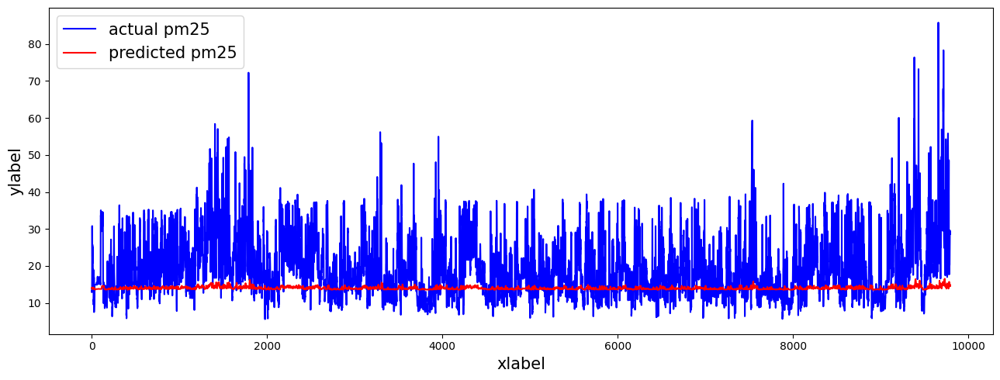

Day = 13
mae: 7.511179083121214
mse: 112.38357846934922
rmse: 10.60111213360887
r2: -359.3722222664863
mape: 0.5948119368777774
mnbe: -35.000984559954276
r_coeff: [0.30752953]


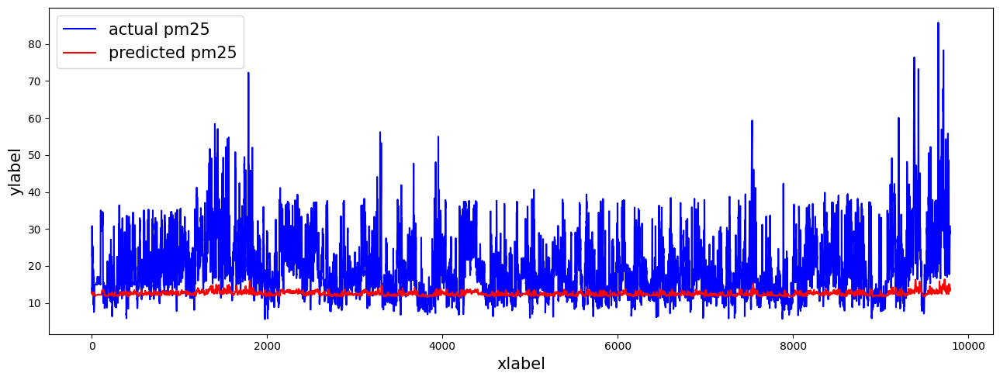

Day = 14
mae: 8.989824821203511
mse: 143.65678394163865
rmse: 11.985690799517508
r2: -419.820366870362
mape: 0.8487179209073761
mnbe: -45.50437538642485
r_coeff: [0.30984934]


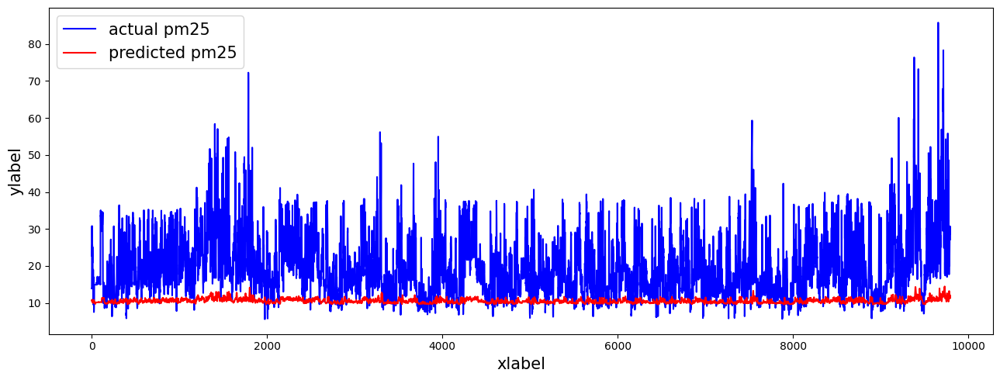

Day = 15
mae: 8.141201070470267
mse: 125.8882489328322
rmse: 11.219993267949505
r2: -526.3937261387542
mape: 0.6958281512611205
mnbe: -39.802047875680856
r_coeff: [0.32276483]


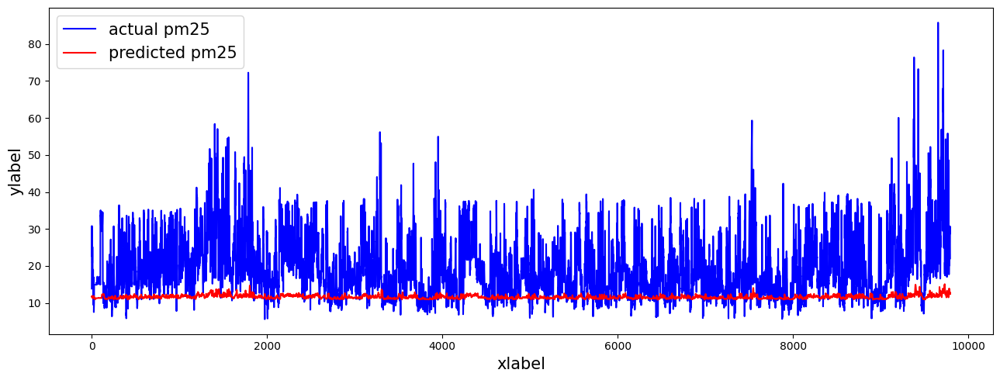

Day = 16
mae: 8.706543602417199
mse: 137.5129523693092
rmse: 11.726591677435913
r2: -379.0855187772078
mape: 0.7950315624069866
mnbe: -43.68237922702273
r_coeff: [0.31579461]


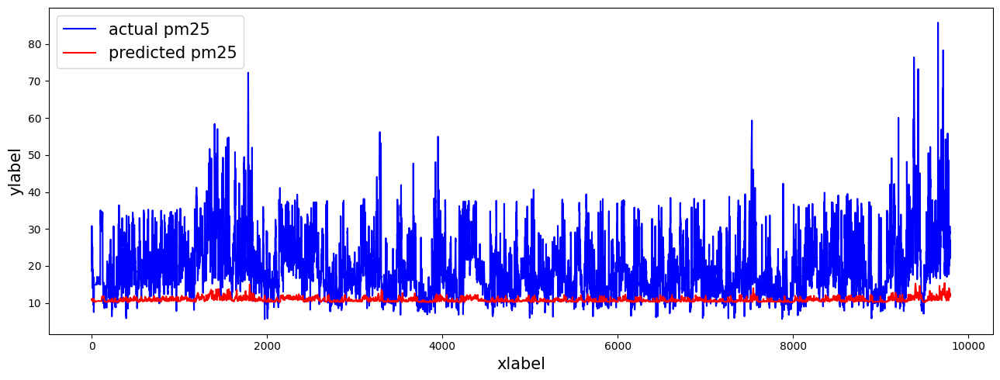

Day = 17
mae: 8.916620197029788
mse: 141.92373244920265
rmse: 11.913174742662118
r2: -448.0650904001444
mape: 0.833420075856329
mnbe: -45.02309419317805
r_coeff: [0.33492136]


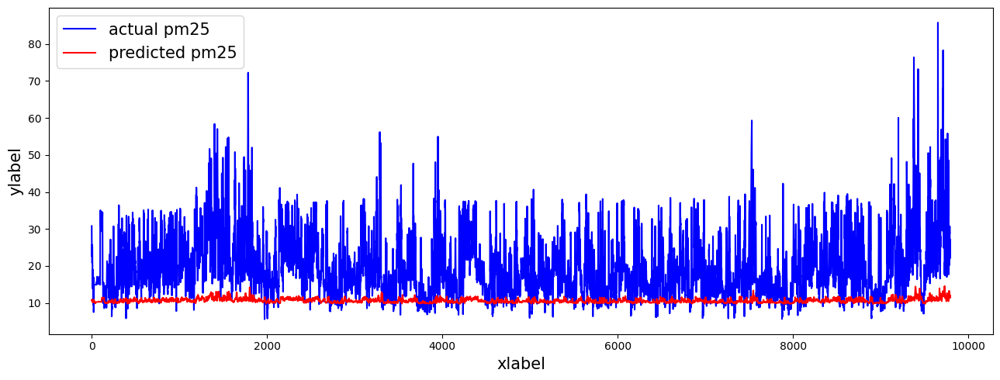

Day = 18
mae: 7.316640992678855
mse: 108.0457885169143
rmse: 10.394507613009589
r2: -1489.7211449623308
mape: 0.561923015377305
mnbe: -32.80702754489071
r_coeff: [0.32978526]


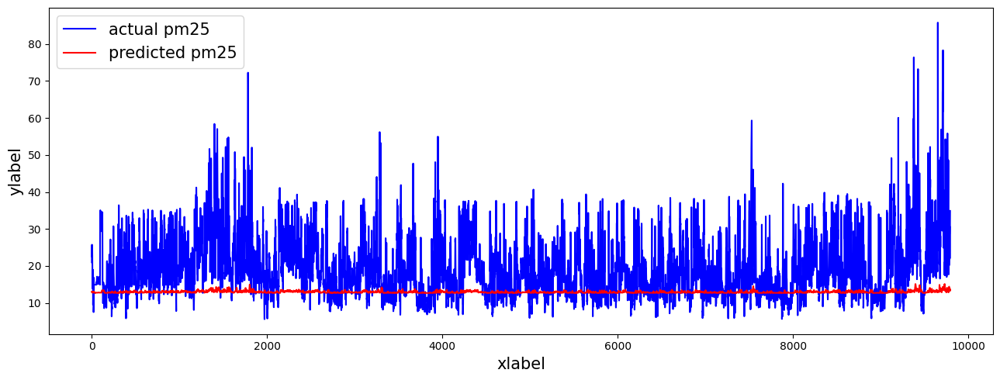

Day = 19
mae: 8.295623628601458
mse: 128.2042196224003
rmse: 11.32273021944797
r2: -251.65877140215733
mape: 0.7206301462861524
mnbe: -41.00875041479297
r_coeff: [0.36003623]


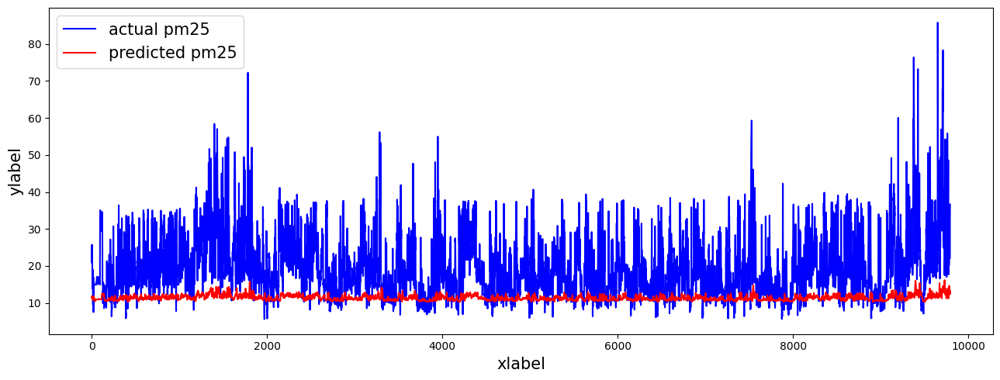

Day = 20
mae: 9.689013002374558
mse: 157.5675959323457
rmse: 12.552593195525207
r2: -376.68366508619386
mape: 0.9867152416910593
mnbe: -49.6552302986118
r_coeff: [0.37179305]


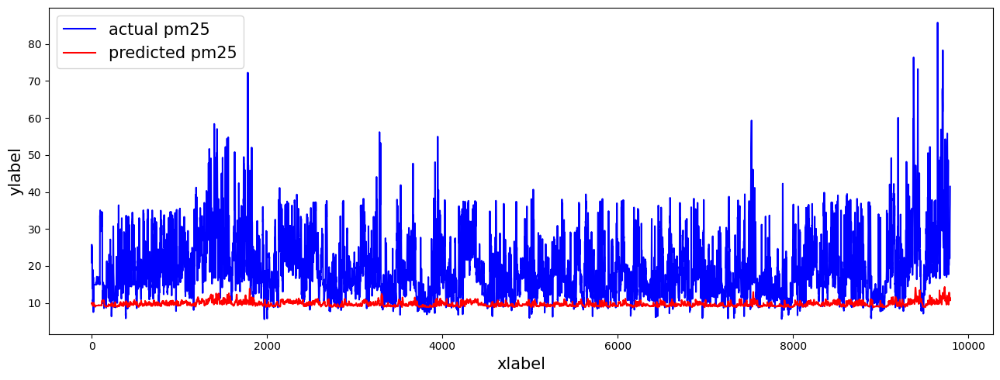

Day = 21
mae: 9.07383183434016
mse: 144.61953942636964
rmse: 12.025786436918363
r2: -323.14229999063446
mape: 0.8610641470647324
mnbe: -46.009013845102146
r_coeff: [0.37150098]


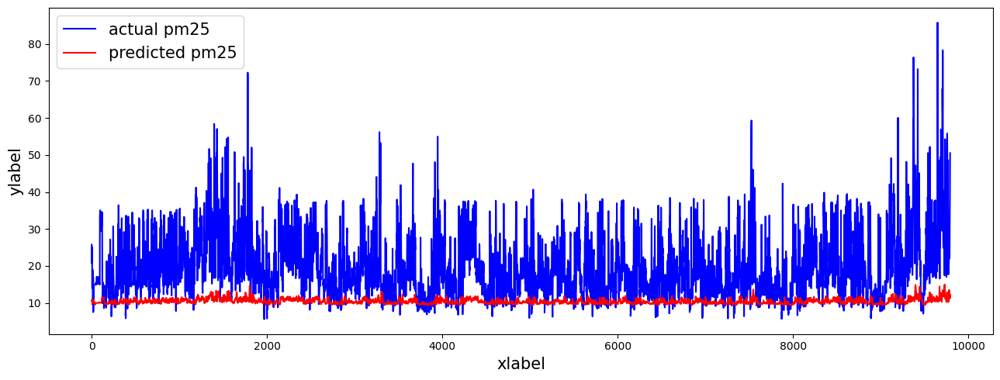

Day = 22
mae: 8.883960786933077
mse: 140.5299281302399
rmse: 11.854531965887135
r2: -276.9742252450592
mape: 0.8244170270975983
mnbe: -44.842096885086
r_coeff: [0.37893012]


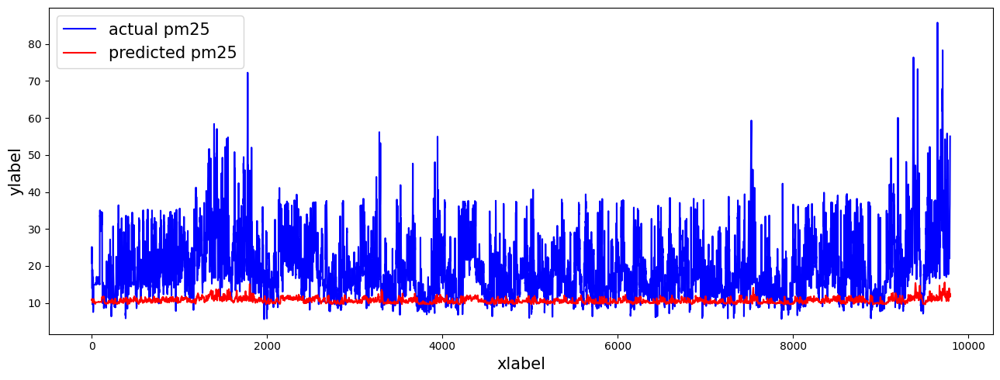

Day = 23
mae: 7.485502722397433
mse: 111.59649120028209
rmse: 10.563924043663041
r2: -527.8005834667132
mape: 0.5875607312298154
mnbe: -34.569470374627244
r_coeff: [0.36816013]


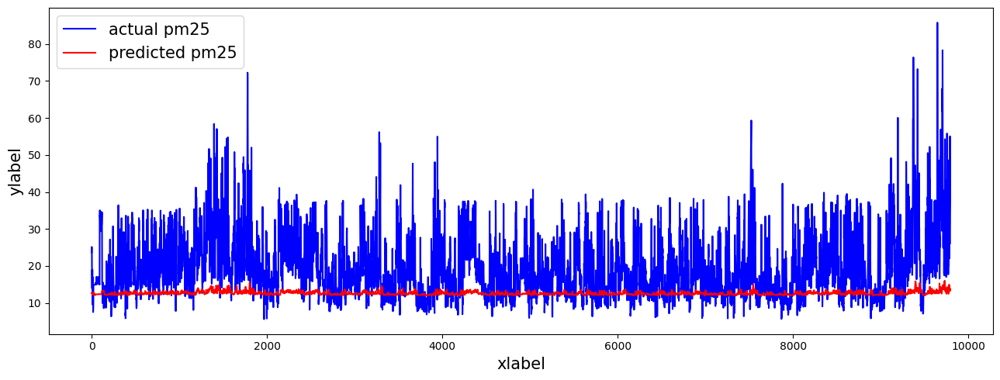

In [14]:
n_future = 24

grus2s = define_grus2s_model(n_past, n_future, X_train_1day.shape[-1], y_train_1day.shape[-1], f"grus2s_{n_future}hours")

history = grus2s.fit(X_train_1day, y_train_1day,
                epochs=epochs,
                batch_size=batch_size,
                validation_split=0.2,
                shuffle=False,
                callbacks = [reduce_lr_callback, early_stopping_callback],
                verbose=1)
plot_learning_curves(history)

# Predict data
y_pred_1day = grus2s.predict(X_test_1day)
print(f"y_pred_1day.shape = {y_pred_1day.shape}")

inv_y_pred_1day = np.expand_dims(label_scaler.inverse_transform(y_pred_1day), -1)
inv_y_test_1day = np.expand_dims(label_scaler.inverse_transform(y_test_1day[:, :, 0]), -1)
print(f"inv_y_pred_1day.shape = {inv_y_pred_1day.shape}\ninv_y_test_1day.shape = {inv_y_test_1day.shape}")

# Evaluation
for day in range(n_future):
    print(f"Day = {day}")
    
    current_day_y_pred, current_day_y_test = inv_y_pred_1day[:, day, :], inv_y_test_1day[:, day, :]
    shifted_inv_y_pred, shifted_inv_y_test = current_day_y_pred[1:], current_day_y_test[:-1]
    
    for metric, calculator in metrics_calculators.items():
        print(f"{metric}: {calculator(shifted_inv_y_pred, shifted_inv_y_test)}")
    plot_2_data(data1=shifted_inv_y_test, datalabel1="actual pm25", data2=shifted_inv_y_pred, datalabel2="predicted pm25")

#print("Plot for first 10 samples")
#for sample_index in range(10):
#    current_inv_y_pred, current_inv_y_test = shifted_y_pred_1day[sample_index], shifted_y_test_1day[sample_index]
#    plot_2_data(data1=current_inv_y_pred, datalabel1="pred", data2=current_inv_y_test, datalabel2="actual")